In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
import time
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from skimage.feature import hog
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from scipy.ndimage.measurements import label
from moviepy.editor import VideoFileClip
# https://discussions.udacity.com/t/good-tips-from-my-reviewer-for-this-vehicle-detection-project/232903

In [2]:
# Find out which vertsion of sklearn => 19
import sklearn
sklearn.__version__

'0.19.1'

## Guide

1. define helper functions
2. using (all images 64x64)
        Data/vehicles/KITTI_extracted (5966 - use first 3900) and 
        Data/non-vehicles/GTI/ (3900)
    for basic training
2. scale
3. optimise parameters
4. train
5. using 
        Data/non-vehicles/Extras (5068)
        
    identify false positives in 'rgb' kernel (which has better precision, worse recall)
    
    add these back to the data, and bring in remaining positives to balance training set
  
6. scale  
6. optimise parameters 2nd time
7. train 2nd time

## (1) Extract HOG features

In [3]:
# Helper functions
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True; transform_sqrt=True pre-debugging
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  block_norm= 'L2-Hys',
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=False, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       block_norm= 'L2-Hys',
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features

# Define a function to compute binned color features  
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel() 
    # Return the feature vector
    return features

# Define a function to compute color histogram features 
# NEED TO CHANGE bins_range if reading .png files with mpimg!
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        ##### image *= 255 # debugging
        ##### image = image.astype(np.uint8) #debugging
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features
    
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

# Define a function to draw bounding boxes
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy


In [4]:
# Define a function to extract features from a single image window
# This function is very similar to extract_features()
# just for a single image rather than list of images
def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    feature_image *= 255 # debug test
    feature_image = feature_image.astype(np.uint8) # debug test
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                        pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    return np.concatenate(img_features)


# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        img_sample = img[window[0][1]:window[1][1], window[0][0]:window[1][0]]
        test_img = cv2.resize(img_sample, (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

   

In [5]:
# Read in paths: cars and notcars => 8792, 8968 resp.
cars = glob.glob('Data/vehicles/**/*.png') # 64x64
notcars = glob.glob('Data/non-vehicles/**/*.png') # 64x64
print(type(cars), len(cars), len(notcars))

<class 'list'> 8792 8968


## (2) HOG Parameter Selection

In [9]:
### Parameter seclection
color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb; NB if YUV, need to scale back up *255 +++
orient = 11  # HOG orientations
pix_per_cell = 16 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 16    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = False # Histogram features on or off
hog_feat = True # HOG features on or off
y_start_stop = [None,None] # Min and max in y to search in slide_window()

t=time.time()
print('Extracting features... (c. 75-154 seconds)')
car_features = extract_features(cars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = extract_features(notcars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to extract feats...')

Extracting features... (c. 75-154 seconds)
44.46 Seconds to extract feats...


In [10]:
# Create an array stack of feature vectors
X = np.vstack((car_features, notcar_features)).astype(np.float64)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=rand_state)

In [11]:
# Fit a per-column scaler using training data

#### Uncomment next line with above debugging scaling uncommented
X_scaler = StandardScaler().fit(X_train)

# X_scaler = StandardScaler().fit(np.vstack(notcar_features).astype(np.float64))
# ... shows that both arrays result in Nan error when not scaled up

# Apply the scaler to training and test data
X_train = X_scaler.transform(X_train)
X_test = X_scaler.transform(X_test)

# Reality check y_train isn't just all ones
y_train

array([0., 0., 1., ..., 0., 1., 0.])

### Parameter selection through cross-validation
(Next cell takes >10 mins)

n=3900, multi-threading takes 99 seconds.

In [11]:
# Set parameters by cross-validation
# http://scikit-learn.org/stable/auto_examples/model_selection/plot_grid_search_digits.html#sphx-glr-auto-examples-model-selection-plot-grid-search-digits-py

# Select half the data for parameter tuning
X_test_dev  = X_test[0:X_test.shape[0]//3]
X_train_dev = X_train[0:X_train.shape[0]//3]
y_test_dev  = y_test[0:y_test.shape[0]//3]
y_train_dev = y_train[0:y_train.shape[0]//3]

# Define parameter space
tuned_parameters = [
    {'kernel':['rbf'],
    'gamma':[1e-3,1e-4],
    'C':[1,10,100,1000]},
    {'kernel':['linear'],
    'C':[1,10,100,1000]}
]

scores = ['precision', 'recall']

# Time this lengthy process
t = time.time()

for score in scores:
    print("# Tuning hyperparams for %s" %score)
    print()
    
    clf = GridSearchCV(SVC(), tuned_parameters, n_jobs=-1, cv=5,
                      scoring='%s_macro' %score)
    clf.fit(X_train_dev, y_train_dev)
    
    print("Best params set found on train set:")
    print()
    print(clf.best_params_)
    print()
    print("Grid scores on train set:")
    print()
    means = clf.cv_results_['mean_test_score']
    stds = clf.cv_results_['std_test_score']
    for mean, std, params in zip(means, stds, clf.cv_results_['params']):
        print("%0.3f (+/-%0.03f) for %r"
              % (mean, std*2, params)
        )
    print()
    print("Detailed classification report:")
    print()
    print("The model is trained on full train set.")
    print("The scores computed on full test set.")
    print()
    y_true, y_pred = y_test_dev, clf.predict(X_test_dev)
    print(classification_report(y_true, y_pred))
    print()
    
t2 = time.time()
print("Time: ", t2-t)

# Tuning hyperparams for precision

Best params set found on train set:

{'C': 10, 'kernel': 'rbf', 'gamma': 0.0001}

Grid scores on train set:

0.985 (+/-0.005) for {'C': 1, 'kernel': 'rbf', 'gamma': 0.001}
0.983 (+/-0.004) for {'C': 1, 'kernel': 'rbf', 'gamma': 0.0001}
0.987 (+/-0.003) for {'C': 10, 'kernel': 'rbf', 'gamma': 0.001}
0.993 (+/-0.004) for {'C': 10, 'kernel': 'rbf', 'gamma': 0.0001}
0.987 (+/-0.003) for {'C': 100, 'kernel': 'rbf', 'gamma': 0.001}
0.992 (+/-0.003) for {'C': 100, 'kernel': 'rbf', 'gamma': 0.0001}
0.987 (+/-0.003) for {'C': 1000, 'kernel': 'rbf', 'gamma': 0.001}
0.992 (+/-0.003) for {'C': 1000, 'kernel': 'rbf', 'gamma': 0.0001}
0.985 (+/-0.009) for {'C': 1, 'kernel': 'linear'}
0.985 (+/-0.009) for {'C': 10, 'kernel': 'linear'}
0.985 (+/-0.009) for {'C': 100, 'kernel': 'linear'}
0.985 (+/-0.009) for {'C': 1000, 'kernel': 'linear'}

Detailed classification report:

The model is trained on full train set.
The scores computed on full test set.

             pre

In [10]:
# rendered obsolete by above
if False:
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(X_train)
    # Apply the scaler to X
    X_train = X_scaler.transform(X_train)
    X_test = X_scaler.transform(X_test)

    print('Using:',orient,'orientations',pix_per_cell,
        'pixels per cell and', cell_per_block,'cells per block')
    print('Feature vector length:', len(X_train[0]))
    # Use a linear SVC 
    svc = LinearSVC(C=10)
    # Check the training time for the SVC
    t=time.time()
    svc.fit(X_train, y_train)
    t2 = time.time()
    print(round(t2-t, 2), 'Seconds to train SVC...')
    # Check the score of the SVC
    print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))

In [12]:
# Use a linear SVC 
svc_linear = LinearSVC(C=1.0)
# Check the training time for the SVC
t=time.time()
svc_linear.fit(X_train, y_train)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc_linear.score(X_test, y_test), 4))

3.82 Seconds to train SVC...
Test Accuracy of SVC =  0.9842


In [13]:
# Use an rbf SVC
svc_rbf = SVC(C=10, kernel='rbf',gamma=0.0001)
t=time.time()
svc_rbf.fit(X_train, y_train)
t2=time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
print('Test Accuracy of SVC = ', round(svc_rbf.score(X_test, y_test), 4))

43.34 Seconds to train SVC...
Test Accuracy of SVC =  0.9918


## rbf beats linear
However this data set suffers from optimism bias since time-series data have been put into both training and testing data.

---
---

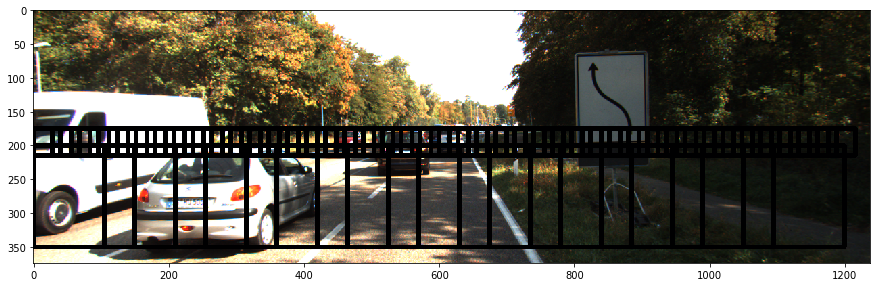

In [18]:
image = mpimg.imread('test_images/001240.png')
draw_image = np.copy(image)

# Uncomment the following line if you extracted training
# data from .png images (scaled 0 to 1 by mpimg) and the
# image you are searching is a .jpg (scaled 0 to 255)
#image = image.astype(np.float32)/255

# Create windows of increasing size as they go down the image
windows1 = slide_window(image, x_start_stop=[None, None], y_start_stop=[175,225], 
                    xy_window=(40, 40), xy_overlap=(0.3, 0.3))
windows2 = slide_window(image, x_start_stop=[None, None], y_start_stop=[200,350], 
                    xy_window=(150, 150), xy_overlap=(0.3, 0.3))
windows3 = slide_window(image, x_start_stop=[None, None], y_start_stop=[200,370], 
                    xy_window=(200, 200), xy_overlap=(0.3, 0.3))
windows = windows1 + windows2 + windows3

# Choose a model (precision-rbf vs recall-linear tradeoff)
svc = svc_linear

hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)                       

window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)                    

plt.figure(figsize=(15,15))
plt.imshow(window_img)
plt.show()

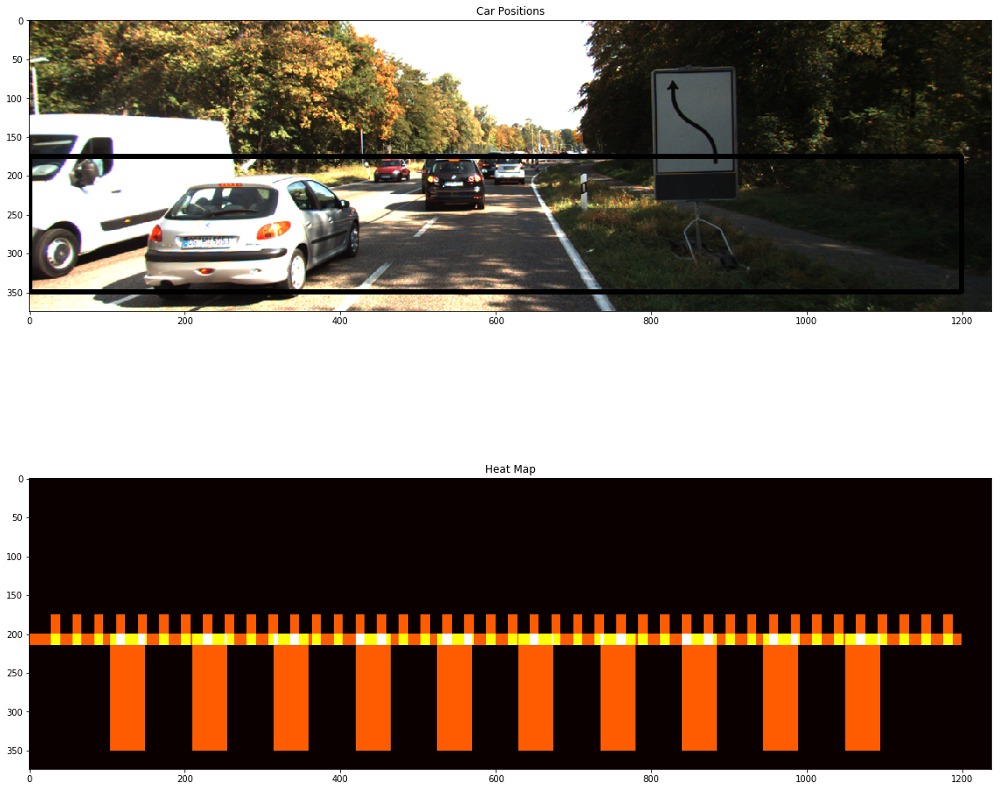

In [23]:
# multiple detections and false positives
# https://classroom.udacity.com/nanodegrees/nd013/parts/fbf77062-5703-404e-b60c-95b78b2f3f9e/modules/2b62a1c3-e151-4a0e-b6b6-e424fa46ceab/lessons/05b03f20-8c4b-453c-b41e-9fac590278c7/concepts/de41bff0-ad52-493f-8ef4-5506a279b812
# tldr: vote, fptp.


def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap
    
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

box_list = hot_windows

# Add heat to each box in box list
heat = np.zeros_like(image[:,:,0]).astype(np.float)
heat = add_heat(heat,box_list)
    
# Apply threshold to help remove false positives
heat = apply_threshold(heat,1.9)

# Visualize the heatmap when displaying    
heatmap = np.clip(heat, 0, 255)

# Find final boxes from heatmap using label function
labels = label(heatmap)
draw_img = draw_labeled_bboxes(np.copy(image), labels)

fig = plt.figure(figsize=(16,16))
plt.subplot(211)
plt.imshow(draw_img)
plt.title('Car Positions')
plt.subplot(212)
plt.imshow(heatmap, cmap='hot')
plt.title('Heat Map')
fig.tight_layout()
plt.show()

# Skipping this whole section (all data used)


## Address false positives with hard negative mining

NB only increases data size by 474 of 6240, or 7.5%

In [15]:
# Do predictions on non-vehicles Extras set
# Extract those whose predictions are 'car', for X
# Create vector of zeros, for y
# Append these to original set
# Repeat optimise/train/test

# Load examples' paths (5068)
notcars_hnm = glob.glob('Data/non-vehicles/Extras/extra*.png') # 64x64
print(len(notcars_hnm), notcars_hnm[0])

5068 Data/non-vehicles/Extras/extra2153.png


In [16]:
# Extract features
hnm_notcar_features = extract_features(notcars_hnm, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

In [17]:
# Create an array stack of feature vectors
X_train_hnm = np.vstack((hnm_notcar_features)).astype(np.float64)

# Define the labels vector
y_hnm = np.hstack(np.zeros(len(hnm_notcar_features)))

# Fit a per-column scaler
X_scaler_hnm = StandardScaler().fit(X_train_hnm)
# Apply the scaler to X
X_train_hnm = X_scaler.transform(X_train_hnm)

In [18]:
# Predict with current model
y_true_hnm, y_pred_hnm = y_hnm, svc_rbf.predict(X_train_hnm)
print(classification_report(y_true_hnm, y_pred_hnm))

             precision    recall  f1-score   support

        0.0       1.00      0.92      0.96      5068
        1.0       0.00      0.00      0.00         0

avg / total       1.00      0.92      0.96      5068



/home/jesse/anaconda2/envs/dl_env_1/lib/python3.5/site-packages/sklearn/metrics/classification.py:1137: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


In [19]:
print(y_pred_hnm.mean()) # 9% false positives (remember this is a non-car-only sample)
y_true_hnm.max()

0.07537490134175218


0.0

In [20]:
# Extract false positives (9% of 5068 = 474)
print(X_train_hnm.shape)
false_positives = X_train_hnm[y_pred_hnm==1]
y_false_positives = np.hstack(np.zeros(false_positives.shape[0]))
print(false_positives.shape, y_false_positives.shape)

(5068, 2004)
(382, 2004) (382,)


In [21]:
# Append false positives to X_train, y_train
# Also append num car pics
# paths, then extract feats, then merge (with pre-scaled previous), then scale ALL data using new all-training-data scale_fit

# Get some more cars to balance false-positives
num = y_false_positives.shape[0]
cars_balance = cars_all[3900:num+3900]
car_features_balance = extract_features(cars_balance, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
X_train_balance = np.vstack((car_features_balance)).astype(np.float64)
y_train_balance = np.hstack((np.ones(len(car_features_balance))))

# Get pre-scaling false positives
hnm_notcar_features = hnm_notcar_features # features extracted above
X_train_false_positives = np.vstack((hnm_notcar_features)).astype(np.float64)[y_pred_hnm==1]

# MERGE. Create an array stack of feature vectors (pre-scaling)
X_train_new = np.concatenate((X_train, X_train_false_positives, X_train_balance),axis=0)

# MERGE. Define the labels vector
y_train_new = np.concatenate((y_train, y_false_positives, y_train_balance),axis=0)
print('X_train_new: ',X_train_new.shape[0],'y_train_new: ',y_train_new.shape[0])

X_train_new:  7004 y_train_new  7004


In [22]:
# SCALE

# Fit a per-column scaler to all new training data
X_scaler = StandardScaler().fit(X_train_new)
# Apply the scaler to training and test data
X_train_new_scaled = X_scaler.transform(X_train_new) # 'new' refers to both data and scaler
X_test_new_scaled = X_scaler.transform(X_test) # 'new' refers to scaler, not data


In [23]:
# Retrain (NB data is scaled already) - NB no visible improvement in accuracy!
# Without refinding optimum parameters

# Use an rbf SVC
svc_rbf_new = SVC(C=10, kernel='rbf',gamma=0.0001)
t=time.time()
svc_rbf_new.fit(X_train_new_scaled, y_train_new)
t2=time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
print('Test Accuracy of SVC = ', round(svc_rbf.score(X_test_new_scaled, y_test), 4))

4.99 Seconds to train SVC...
Test Accuracy of SVC =  0.9833


In [24]:
# Use a linear SVC 
svc_linear_new = LinearSVC(C=10)
# Check the training time for the SVC
t=time.time()
svc_linear_new.fit(X_train_new_scaled, y_train_new)
t2 = time.time()
print(round(t2-t, 2), 'Seconds to train SVC...')
# Check the score of the SVC
print('Test Accuracy of SVC = ', round(svc.score(X_test_new_scaled, y_test), 4))

0.85 Seconds to train SVC...
Test Accuracy of SVC =  0.9859


In [25]:
def reality_check(im_path='001240.png'):

    image = mpimg.imread(im_path)
    draw_image = np.copy(image)

    # Uncomment the following line if you extracted training
    # data from .png images (scaled 0 to 1 by mpimg) and the
    # image you are searching is a .jpg (scaled 0 to 255)
    #image = image.astype(np.float32)/255

    # Create windows of increasing size as they go down the image
    windows1 = slide_window(image, x_start_stop=[None, None], y_start_stop=[175,225], 
                        xy_window=(50, 50), xy_overlap=(0.4, 0.4))
    windows2 = slide_window(image, x_start_stop=[None, None], y_start_stop=[200,350], 
                        xy_window=(100, 100), xy_overlap=(0.4, 0.4))
    windows3 = slide_window(image, x_start_stop=[None, None], y_start_stop=[200,360], 
                        xy_window=(160, 160), xy_overlap=(0.4, 0.4))
    windows = windows1 + windows2 + windows3

    # Choose a model (precision-rbf vs recall-linear tradeoff)
    svc = svc_rbf_new

    hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)                       

    window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)                    

    box_list = hot_windows

    # Add heat to each box in box list
    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    heat = add_heat(heat,box_list)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,0.1)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(image), labels)

    fig = plt.figure(figsize=(16,16))
    plt.subplot(311)
    plt.imshow(window_img)
    plt.subplot(312)
    plt.imshow(draw_img)
    plt.title('Car Positions')
    plt.subplot(313)
    plt.imshow(heatmap, cmap='hot')
    plt.title('Heat Map')
    fig.tight_layout()
    plt.show()

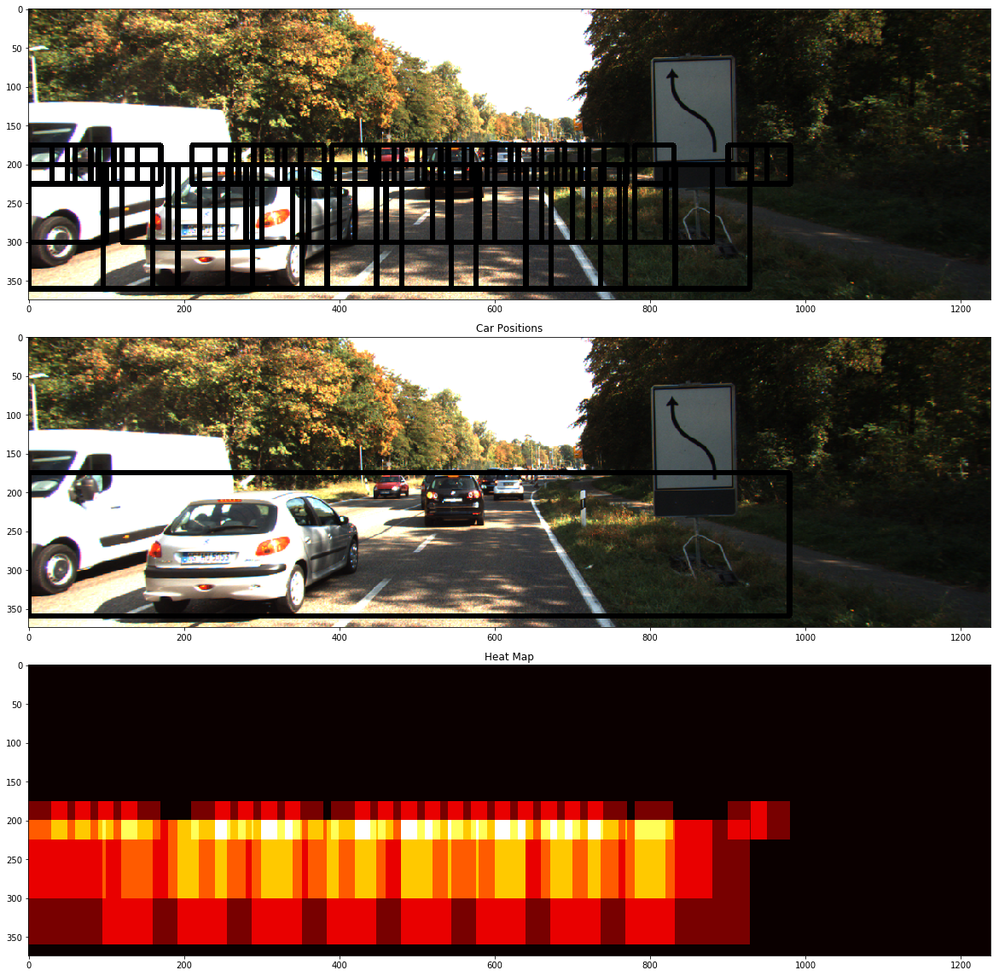

In [26]:
reality_check()

## Accuracy up, test case questionable

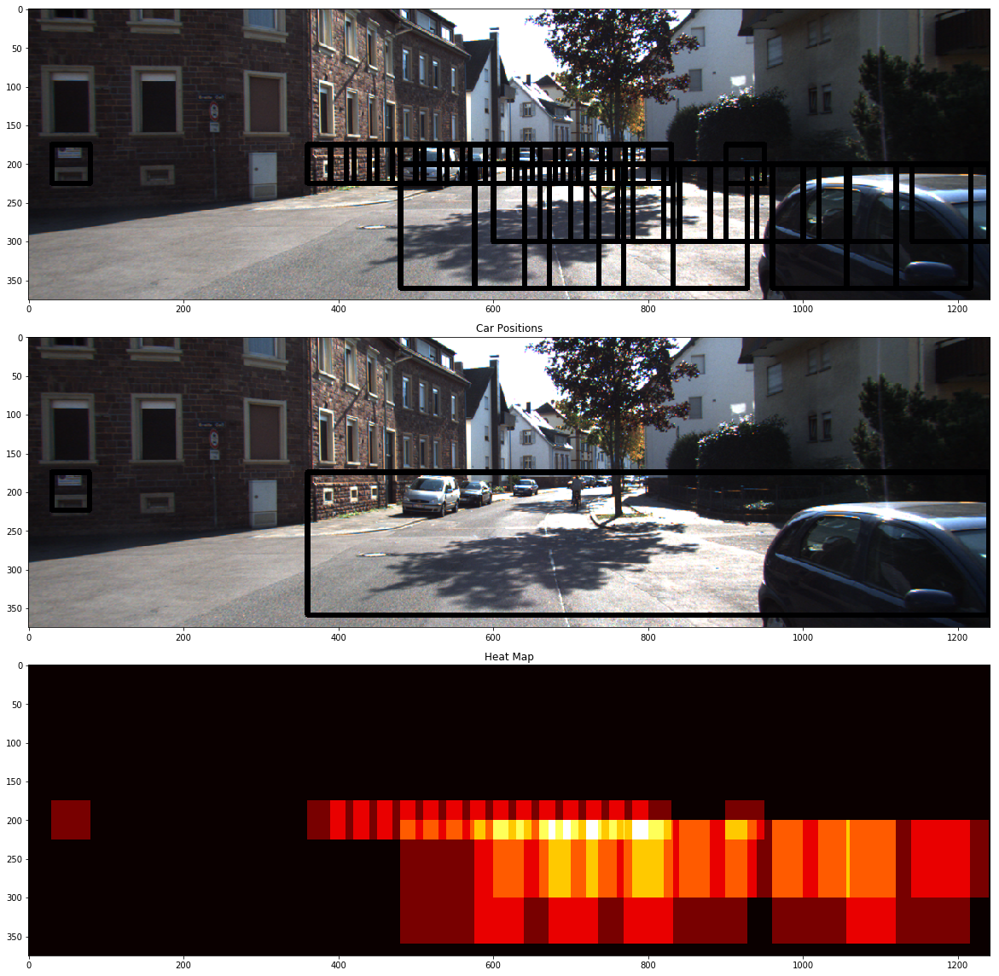

In [27]:
reality_check(im_path='000528.png')

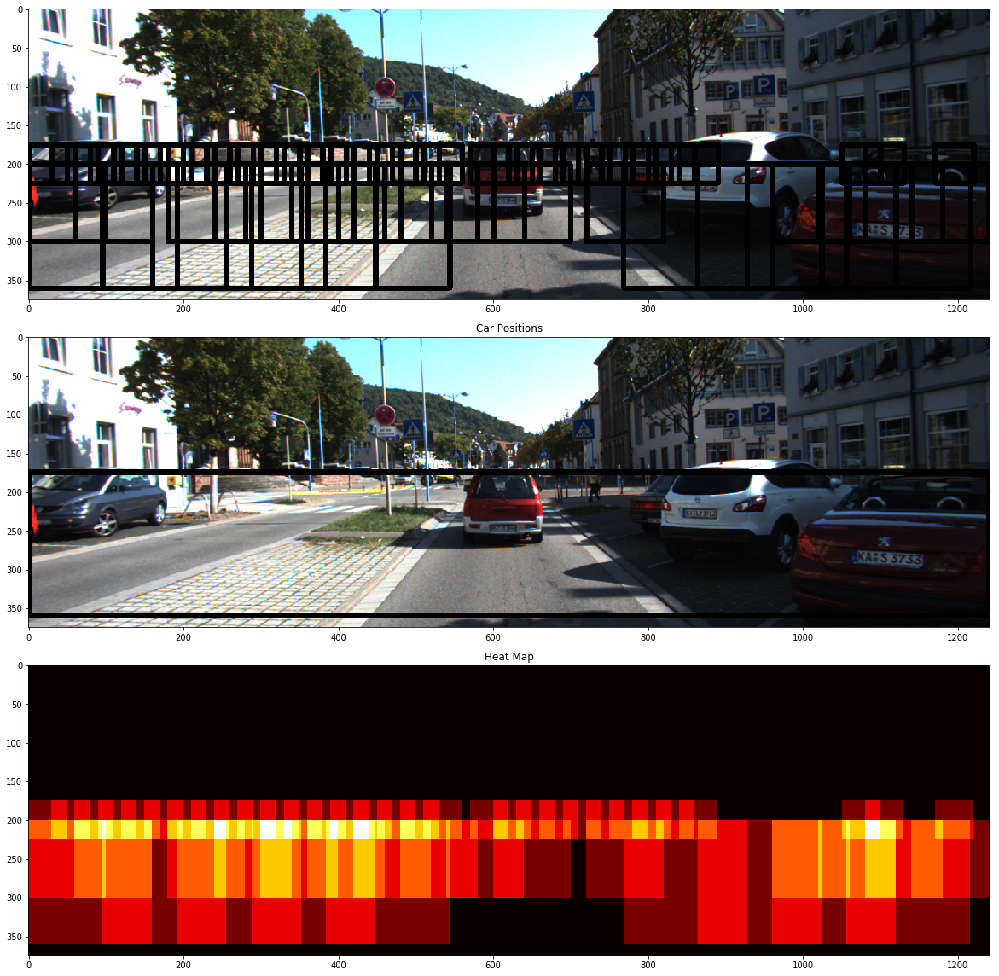

In [28]:
reality_check(im_path='000275.png')

## For next round of experimentation, use project video frames
These have fewer cars per frame

In [21]:
# Read
vidcap = cv2.VideoCapture('../Advanced-Lane-Lines/project_video.mp4')

In [22]:
# Loop, extracting 1000 frames, write to Frames/
success, image = vidcap.read()
count = 0
while success:
    count += 1
    if count%100==0:
        success, image = vidcap.read()
        #image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        cv2.imwrite('Frames/'+str(int(count//100))+'.jpg', image)
        #mpimg.imsave('Frames/'+str(count)+'.jpg', image)
    if count/100 >= 1000:
        break

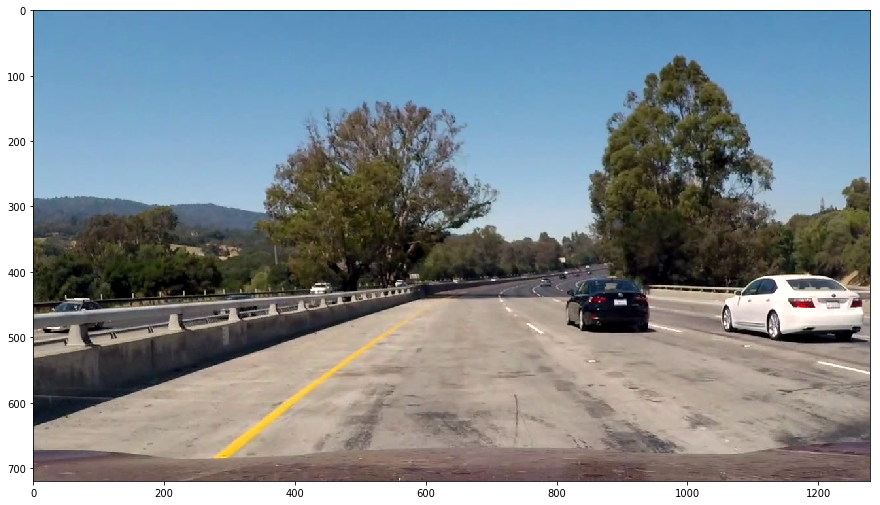

In [15]:
plt.figure(figsize=(15,15,))
plt.imshow(mpimg.imread('Frames/1000.jpg'))
plt.show()

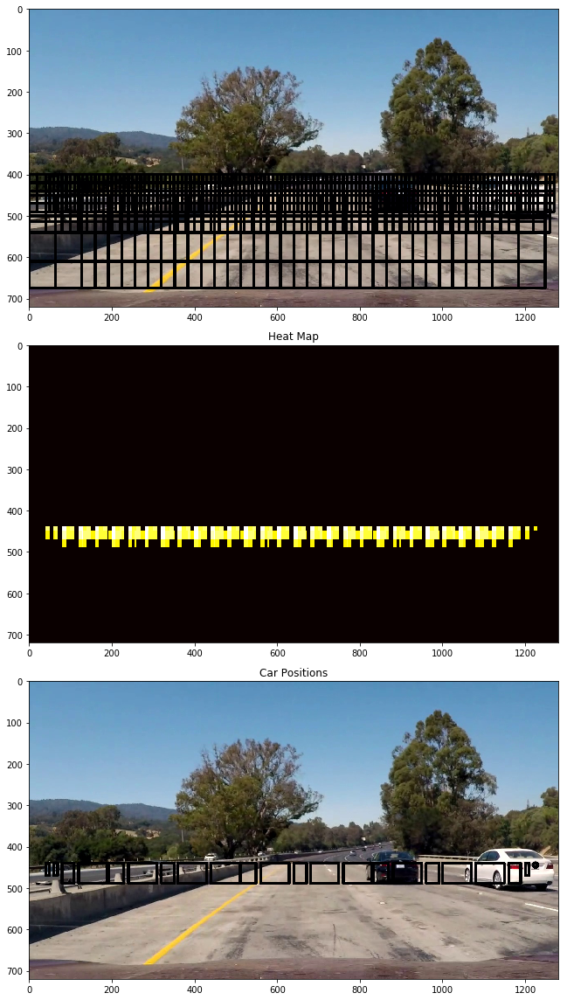

In [96]:
# Now we're using jpgs, different size, different car density.
# Experiment with overlap, start-stop, window size etc

def process(image = mpimg.imread('Frames/1000.jpg'), visualize=False, rescale=True):

    #image = mpimg.imread(im_path)
    # Adjust format (training on png images, jpg images need rescaling; mp4 stills?
    #if im_path[-3:] == 'jpg':
    if rescale == True:
        image = image.astype(np.float32)/255
    draw_image = np.copy(image)

    # Uncomment the following line if you extracted training
    # data from .png images (scaled 0 to 1 by mpimg) and the
    # image you are searching is a .jpg (scaled 0 to 255)
    #image = image.astype(np.float32)/255

    # Create windows of increasing size as they go down the image
    windows1 = slide_window(image, x_start_stop=[None, None], y_start_stop=[400,500], 
                        xy_window=(50, 50), xy_overlap=(0.6, 0.6))
    windows2 = slide_window(image, x_start_stop=[None, None], y_start_stop=[400,550], 
                        xy_window=(100, 100), xy_overlap=(0.6, 0.6))
    windows3 = slide_window(image, x_start_stop=[None, None], y_start_stop=[450,700], 
                        xy_window=(160, 160), xy_overlap=(0.6, 0.6))
    windows = windows1 + windows2 + windows3

    # Choose a model (precision-rbf vs recall-linear tradeoff)
    svc = svc_linear

    hot_windows = search_windows(image, windows, svc, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)                       

    window_img = draw_boxes(draw_image, hot_windows, color=(0, 0, 255), thick=6)                    

    box_list = hot_windows

    # Add heat to each box in box list
    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    heat = add_heat(heat,box_list)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat,10)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(image), labels)

    if visualize:
    
        fig = plt.figure(figsize=(16,16))
        plt.subplot(311)
        plt.imshow(window_img)
        plt.subplot(312)
        plt.imshow(heatmap, cmap='hot')
        plt.title('Heat Map')
        plt.subplot(313)
        plt.imshow(draw_img)
        plt.title('Car Positions')
        fig.tight_layout()
        plt.show()
        
    else:
        return draw_img

process(mpimg.imread('Frames/1000.jpg'), visualize=True, rescale=True)

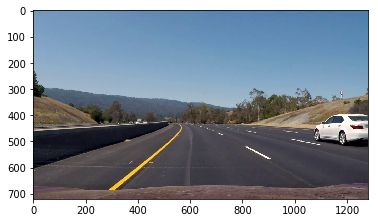

In [26]:
out_img = process(mpimg.imread('Frames/200.jpg'),False,False)
plt.imshow(out_img)
plt.show()

In [31]:
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    if conv == 'RGB2YUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)


# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop, scale, svc, X_scaler, orient, pix_per_cell, \
              cell_per_block, spatial_size, hist_bins, rescale=True):
    
    draw_img = np.copy(img)
    if rescale:
        img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch, rescale to training image size
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                
    return draw_img

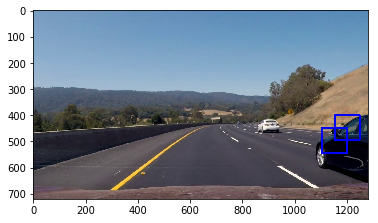

In [71]:
# Chalkboard 1
ystart = 400
ystop = 600
scale = 1.5
    
out_img = find_cars(mpimg.imread('Frames/700.jpg'), ystart, ystop, scale, svc, X_scaler, \
                    orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, rescale=True)

plt.imshow(out_img)
plt.show()

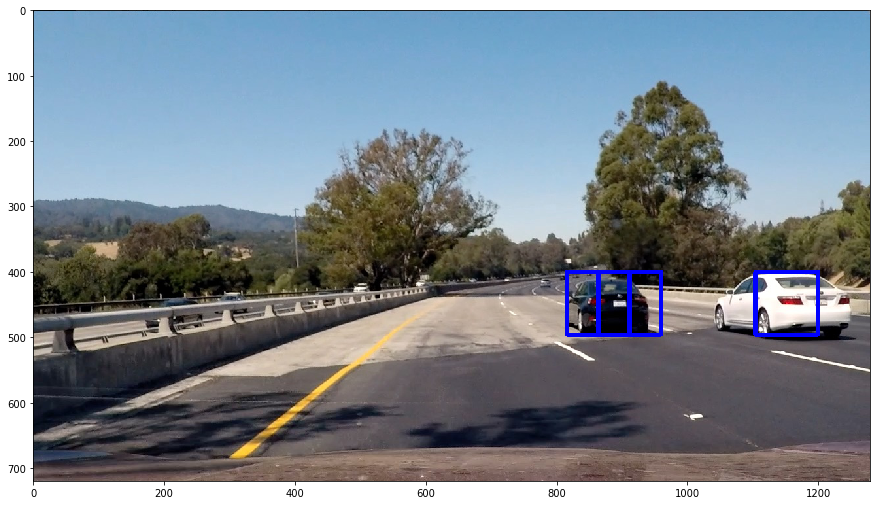

In [68]:
# Chalkboard 2
ystart = 400
ystop = 600
scale = 1.5

test_image = mpimg.imread('test_images/test_image_real.jpg')

out_img = find_cars(test_image, ystart, ystop, scale, svc, X_scaler, \
                    orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, rescale=True)
plt.figure(figsize=(15,10))
plt.imshow(out_img)
plt.show()

In [42]:
# Run find_cars across several window sizes
def find_cars_1(img, ystart, ystop, scale_list, svc, X_scaler, orient, pix_per_cell, \
              cell_per_block, spatial_size, hist_bins, rescale=True):
    
    draw_img = np.copy(img)
    if rescale:
        img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    
    # Loop over scales in scale_list
    box_list = []
    for scale in scale_list:

        if scale != 1:
            imshape = ctrans_tosearch.shape
            ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))

        ch1 = ctrans_tosearch[:,:,0]
        ch2 = ctrans_tosearch[:,:,1]
        ch3 = ctrans_tosearch[:,:,2]

        # Define blocks and steps as above
        nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
        nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
        nfeat_per_block = orient*cell_per_block**2

        # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
        window = 64
        nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
        cells_per_step = 2  # Instead of overlap, define how many cells to step
        nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
        nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1

        # Compute individual channel HOG features for the entire image
        hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
        hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
        hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)

        for xb in range(nxsteps):
            for yb in range(nysteps):
                ypos = yb*cells_per_step
                xpos = xb*cells_per_step
                # Extract HOG for this patch
                hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

                xleft = xpos*pix_per_cell
                ytop = ypos*pix_per_cell

                # Extract the image patch, rescale to training image size
                subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))

                # Get color features
                spatial_features = bin_spatial(subimg, size=spatial_size)
                hist_features = color_hist(subimg, nbins=hist_bins)

                # Scale features and make a prediction
                test_features = X_scaler.transform(np.hstack((spatial_features, hog_features)).reshape(1, -1))    
                #test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
                #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
                test_prediction = svc.predict(test_features)

                if test_prediction == 1:
                    xbox_left = np.int(xleft*scale)
                    ytop_draw = np.int(ytop*scale)
                    win_draw = np.int(window*scale)
                    cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                    box_list.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))

    return draw_img, box_list

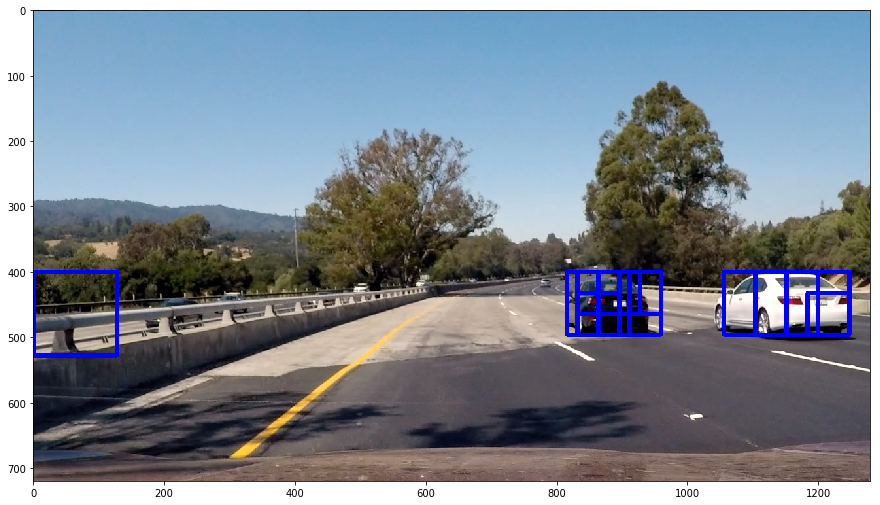

In [97]:
# Chalkboard 3
ystart = 400
ystop = 600
scale_list = [1, 1.5, 2]

test_image = mpimg.imread('test_images/test_image_real.jpg')

out_img1, box_list = find_cars_1(test_image, ystart, ystop, scale_list, svc, X_scaler, \
                    orient, pix_per_cell, cell_per_block, spatial_size, hist_bins, rescale=True)
plt.figure(figsize=(15,10))
plt.imshow(out_img1)
plt.show()

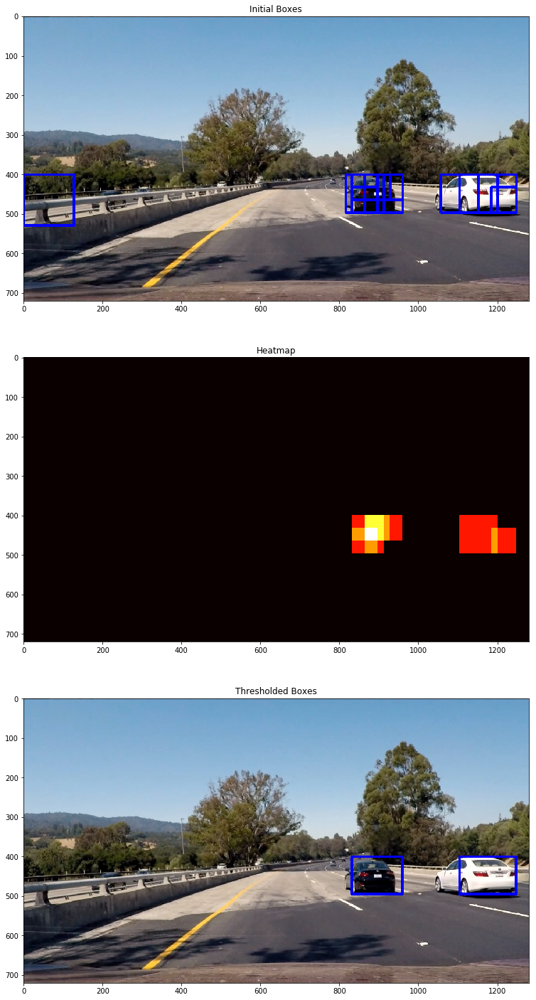

In [102]:
# Use heat

box_list = box_list

# Add heat to each box in box list
heat = np.zeros_like(test_image[:,:,0]).astype(np.float)
heat = add_heat(heat,box_list)

# Apply threshold to help remove false positives
heat = apply_threshold(heat,1)

# Visualize the heatmap when displaying    
heatmap = np.clip(heat, 0, 255)

# Find final boxes from heatmap using label function
labels = label(heatmap)
draw_img = draw_labeled_bboxes(np.copy(test_image), labels)

plt.figure(figsize=(15,25))
plt.subplot(311)
plt.title('Initial Boxes')
plt.imshow(out_img1)
plt.subplot(312)
plt.title('Heatmap')
plt.imshow(heatmap,cmap='hot')
plt.subplot(313)
plt.title('Thresholded Boxes')
plt.imshow(draw_img)
plt.savefig('examples/heatmap.jpg')
plt.show()

In [79]:
# With heat
def find_cars_2(img, ystart, ystop, scale_list, svc, X_scaler, orient, pix_per_cell, \
              cell_per_block, spatial_size, hist_bins, rescale=True):
    
    draw_img = np.copy(img)
    if rescale:
        img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    
    # Loop over scales in scale_list
    box_list = []
    for scale in scale_list:

        if scale != 1:
            imshape = ctrans_tosearch.shape
            ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))

        ch1 = ctrans_tosearch[:,:,0]
        ch2 = ctrans_tosearch[:,:,1]
        ch3 = ctrans_tosearch[:,:,2]

        # Define blocks and steps as above
        nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
        nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
        nfeat_per_block = orient*cell_per_block**2

        # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
        window = 64
        nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
        cells_per_step = 2  # Instead of overlap, define how many cells to step
        nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
        nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1

        # Compute individual channel HOG features for the entire image
        hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
        hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
        hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)

        for xb in range(nxsteps):
            for yb in range(nysteps):
                ypos = yb*cells_per_step
                xpos = xb*cells_per_step
                # Extract HOG for this patch
                hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

                xleft = xpos*pix_per_cell
                ytop = ypos*pix_per_cell

                # Extract the image patch, rescale to training image size
                subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))

                # Get color features
                spatial_features = bin_spatial(subimg, size=spatial_size)
                hist_features = color_hist(subimg, nbins=hist_bins)

                # Scale features and make a prediction
                test_features = X_scaler.transform(np.hstack((spatial_features, hog_features)).reshape(1, -1))    
                #test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
                #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))    
                test_prediction = svc.predict(test_features)

                if test_prediction == 1:
                    xbox_left = np.int(xleft*scale)
                    ytop_draw = np.int(ytop*scale)
                    win_draw = np.int(window*scale)
                    cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6) 
                    box_list.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))

    return draw_img, box_list

def process_1(image, heat_threshold=1):
    draw_img, box_list = find_cars_2(image, ystart, ystop, scale_list, svc, X_scaler, orient, pix_per_cell, \
              cell_per_block, spatial_size, hist_bins, rescale=True)
    # Add heat to each box in box list
    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    heat = add_heat(heat,box_list)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat, heat_threshold)

    # Visualize the heatmap when displaying    
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    draw_img = draw_labeled_bboxes(np.copy(image), labels)   
    
    return draw_img

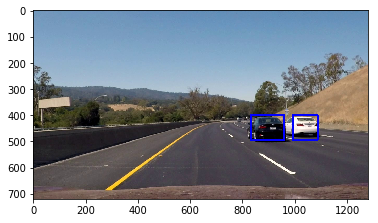

In [109]:
# check

svc = svc_rbf

test_output_still = process_1(mpimg.imread('Frames/900.jpg'),1)

plt.imshow(test_output_still)
plt.show()

In [115]:
# Generate some illustration images
plt.figure(figsize=(25,25))

for i in range(9):
    r = np.random.randint(0,1000)
    path = 'Frames/' + str(r) + '.jpg'
    img = mpimg.imread(path)
    out = process_1(img)
    plt.subplot(3,3,i+1)
    plt.title('Pipeline: ' + path)
    plt.imshow(out)

In [116]:
plt.savefig('examples/Pipeline.jpg')

## Process Video

In [92]:
### Standard
# Define class for tracking
# Instantiate class for tracking

video_output = 'output/project_video_solution5.mp4'

clip = VideoFileClip('../Advanced-Lane-Lines/project_video.mp4')#.subclip(20,21)
## clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4')

clip = clip.fl_image(process_1)
%time clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video output/project_video_solution5.mp4
[MoviePy] Writing video output/project_video_solution5.mp4


100%|█████████▉| 1260/1261 [22:31<00:01,  1.02s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output/project_video_solution5.mp4 

CPU times: user 22min 32s, sys: 3.77 s, total: 22min 36s
Wall time: 22min 32s
